# 19M041DOS2 2023/2024 – prvi domaći zadatak

**sudent:** Veljko Milojevic\
**broj indeksa:** 2023/3066

## Ucitavanje biblioteka

In [1]:
import cv2 as cv
import numpy as np
import os
import matplotlib.pyplot as plt

/home/pc/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


## Definisanje konstanti

In [2]:
FIGSIZE = (16, 9)
DPI = 80
S = 5

## ZADATAK 1 – Realizacija DoG detektora obeležja
U okviru ovog zadatka potrebno je realizovati detektor karakterističnih tačaka koje su stabilne u
odnosu na translaciju, rotaciju i skaliranje. Kako bi se ostvarila invarijantnost u odnosu na
skaliranje karakteristične tačke se traže u okviru DoG (Difference of Gaussian) piramide, čime se
osim prostorne pozicije određuje i karakteristična skala obeležja. Funkciju je potrebno realizovati
u više koraka navedenih u nastavku.


### createPyramid
Prvi korak predstavlja realizaciju funkcije kojom se kreiraju nedecimirana Gausova
piramida i DoG piramida ulazne slike. Funkciju nazvati **createPyramid**. Argumenti
funkcije su:

**Ulazi**:\
    **img** – *ulazna slika sadrži jednu ravan a vrednosti piksela su u opsegu (0,1)*\
    **sigma0** – *standardna devijacija Gausovog filtra za određivanje nultog nivoa piramide*\
    **k** – *faktor povećanja standardne devijacije filtra za određivanje narednog nivoa piramide*\
    **numLevels** – *DoG piramida sadrži sve nivoe od 0 do numLevels-1*\

**Izlaz**:\
    **GaussianPyramid** – *lista u okviru koje se nalaze nivoi kreirane Gausove piramide.
    Ova piramida sadrži sve nivoe od 0 do numLevels-1.*\
    **DoGPyramid** – *lista u okviru koje se nalaze razlike susednih nivoa Gausove piramide.
    L-ti nivo DoG piramide predstavlja razliku L-1 i L-tog nivoa Gausove piramide.*\

Obratiti pažnju da je za kreiranje nivoa DoG piramide od 0 do numLevels-1 potrebno
kreirati Gausovu piramidu sa nivoima od -1 do numLevels-1.\
Standardna devijacija Gausovog filtra koji se koristi za dobijanje l-tog nivoa Gausove
piramide je:
$$\sigma_l = k^l \sigma_0$$

U izveštaju opisati realizaciju i prikazati rezultate funkcije. Prilikom testiranja koristiti
sledeće parametre: $\sigma_0 = 1, k=\sqrt2, N_l=5$.


#### Implementacija
**Komentar**: za pocetni nivo Gausove piramide koristi je polazna slika, moze se uzeti i $l=-1$ i primeniti formula navedena u zadatku, sto efektivno dovodi do filtriranja filtrom male standardne devijacije i malog zamucenja, pa je efikasnije ne sprovoditi filtraciju.

In [3]:
def createPyramid(img, sigma0, k, numLevels):
    """
    Ulazi:
        img – ulazna slika sadrži jednu ravan a vrednosti piksela su u opsegu (0,1)
        sigma0 – standardna devijacija Gausovog filtra za određivanje nultog nivoa piramide
        k – faktor povećanja standardne devijacije filtra za određivanje narednog nivoa piramide
        numLevels – DoG piramida sadrži sve nivoe od 0 do numLevels-1
    
    Izlaz:
        GaussianPyramid – lista u okviru koje se nalaze nivoi kreirane Gausove piramide.
        Ova piramida sadrži sve nivoe od 0 do numLevels-1.
        DoGPyramid – lista u okviru koje se nalaze razlike susednih nivoa Gausove piramide.
        L-ti nivo DoG piramide predstavlja razliku L-1 i L-tog nivoa Gausove piramide.
    """
    GaussianPyramid = [img]
    DoGPyramid = []

    for l in range(numLevels):
        sigma = sigma0*np.power(k, l)
        GaussianPyramid.append(cv.GaussianBlur(src=img,
                                               ksize=(0, 0),
                                               sigmaX=sigma))
        DoGPyramid.append(GaussianPyramid[-1] - GaussianPyramid[-2])

    return GaussianPyramid[1::], DoGPyramid

#### Prikaz rezultata

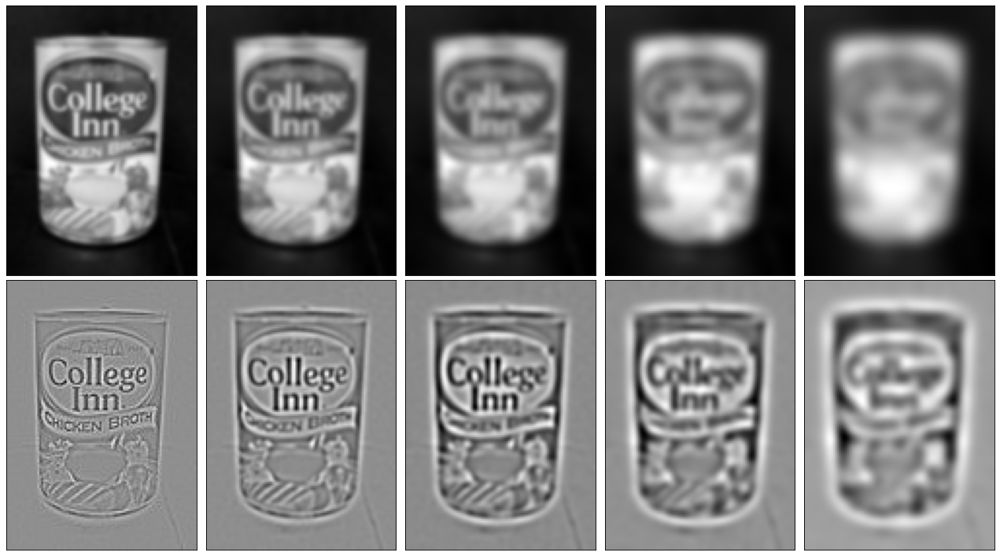

In [4]:
dir_path = "./imgs/can"
file_name = "can_model.jpg"
file_path = os.path.join(dir_path, file_name)
img = cv.imread(file_path, cv.IMREAD_GRAYSCALE)
img = img / 255.

sigma0 = 1
k = np.sqrt(2)
numLevels = 5

GaussianPyramid, DoGPyramid = createPyramid(img, sigma0, k, numLevels)

fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI, ncols=numLevels, nrows=2)

for i in range(numLevels):
    ax[0, i].imshow(GaussianPyramid[i], cmap="gray")
    ax[0, i].set_xticks([], []), ax[0, i].set_yticks([], [])
    ax[1, i].imshow(DoGPyramid[i], cmap="gray")
    ax[1, i].set_xticks([], []), ax[1, i].set_yticks([], [])

plt.tight_layout()

### detectDoGFeatures
Nakon toga potrebno je pronaći tačke koje predstavljaju lokalne ekstremume u prostoru
i skali DoG piramide. Posmatrati lokalno susedstvo koje pored 8 suseda sa iste skale uzima
i po jednog suseda iz svake od dve susedne skale. Potrebno je da funkcija ima mogućnost
odbacivanja odziva koji pripadaju uniformnim površinama (mala apsolutna vrednost DoG
odziva) ili pripadaju ivicama (nije zadovoljena kritrerijumska funkcija na bazi Hesijana).
Funkciju nazvati **detectDoGFeatures**. Argumenti funkcije su:

**Ulazi**:\
    **DoGPyramid** – *lista u okviru koje se nalaze razlike susednih nivoa Gausove piramide.
    L-ti nivo DoG piramide predstavlja razliku L-1 i L-tog nivoa Gausove piramide.*\
    **uniformThr** – *vrednost praga kojom se odbacuju uniformne površine*\
    **edgeThr** – *vrednost praga kojom se odbacuju ivični odzivi*

**Izlaz**:\
    **featureLocations** – *Nx3 matrica koja sadrži N detektovanih lokacija obeležja koja zadovoljavaju
    postavljene kriterijume. Svako detektovano obeležje predstavlja uređenu
    trojku (x, y, level).*

U izveštaju opisati realizaciju i prikazati rezultate funkcije. Prilikom testiranja koristiti
sledeće parametre: $\theta_u = 0.03 , \theta_e = 12$ za pragove detektora.

#### Implementacija
Na svaki nivo Dog piramide se primenjuje Sobel-ov filtar kojim se dobijaju aproksimacije gradijenta po obe ose velicinom kernela 5. Nakon toga se formira matrica M, iz koje se formira kriterijum R, po kom se odbaciju ivicne detekcije, dok se poredjenjem intenziteta piksela odgovarajuceg nivoa Dog piramide sa pragom odbacuju detekcije na uniformnim regionima.   

In [5]:
def detectDoGFeatures(DoGPyramid, uniformThr, edgeThr):
    """
    Ulazi:
        DoGPyramid – lista u okviru koje se nalaze razlike susednih nivoa Gausove piramide.
        L-ti nivo DoG piramide predstavlja razliku L-1 i L-tog nivoa Gausove piramide.
        uniformThr – vrednost praga kojom se odbacuju uniformne površine
        edgeThr – vrednost praga kojom se odbacuju ivični odzivi
    
    Izlaz:
        featureLocations – Nx3 matrica koja sadrži N detektovanih lokacija obeležja koja zadovoljavaju
        postavljene kriterijume. Svako detektovano obeležje predstavlja uređenu
        trojku (x, y, level)
    """
    featureLocations = []
    levels = len(DoGPyramid)
    h, w = DoGPyramid[0].shape
    for l in range(0, levels):
        sobelx = cv.Sobel(DoGPyramid[l], cv.CV_64F, 1, 0, ksize=5)
        sobely = cv.Sobel(DoGPyramid[l], cv.CV_64F, 0, 1, ksize=5)
        for i in range(1, h-1):
            for j in range(1, w-1):
                Ix = sobelx[i-1:i+2, j-1:j+2]
                Ix[1, 1] = 0
                Ix = Ix.flatten()
                Iy = sobely[i-1:i+2, j-1:j+2]
                Iy[1, 1] = 0
                Iy = Iy.flatten()

                M = np.array([[Ix.dot(Ix), Ix.dot(Iy)],
                             [Ix.dot(Iy), Iy.dot(Iy)]])
                R = np.trace(M)**2/np.linalg.det(M)

                temp = np.zeros(shape=(11,))
                temp[0:9] = DoGPyramid[l][i-1:i+2, j-1:j+2].flatten()
                if l > 1:
                    temp[9] = DoGPyramid[l-1][i, j]
                if l < levels-1:
                    temp[10] = DoGPyramid[l+1][i, j]

                loc_min = np.min(temp)
                loc_max = np.max(temp)

                test_pixel = DoGPyramid[l][i, j]

                if (test_pixel == loc_max) or (test_pixel == loc_min):
                    if np.abs(test_pixel) >= uniformThr:
                        if edgeThr == 0:
                            featureLocations.append(np.array([i, j, l]))
                        elif R < (1+edgeThr)**2/edgeThr:
                            featureLocations.append(np.array([i, j, l]))

    return np.array(featureLocations)

#### Prikaz rezultata

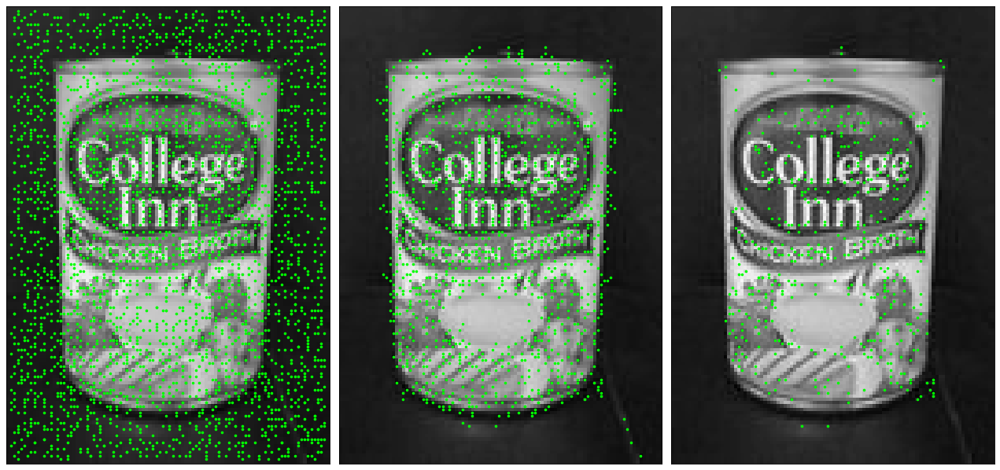

In [6]:
uniformThr = 0.03
edgeThr = 12

featureLocations = detectDoGFeatures(DoGPyramid, uniformThr=0, edgeThr=0)
fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI, nrows=1, ncols=3)
ax = ax.ravel()
ax[0].imshow(img, cmap="gray")
ax[0].scatter(featureLocations[:, 1], featureLocations[:, 0], s=S, c="lime")
ax[0].set_xticks([], []), ax[0].set_yticks([], [])

featureLocations = detectDoGFeatures(DoGPyramid, uniformThr, edgeThr=0)
ax[1].imshow(img, cmap="gray")
ax[1].scatter(featureLocations[:, 1], featureLocations[:, 0], s=S, c="lime")
ax[1].set_xticks([], []), ax[1].set_yticks([], [])

featureLocations = detectDoGFeatures(DoGPyramid, uniformThr, edgeThr)
ax[2].imshow(img, cmap="gray")
ax[2].scatter(featureLocations[:, 1], featureLocations[:, 0], s=S, c="lime")
ax[2].set_xticks([], []), ax[2].set_yticks([], [])
plt.tight_layout()

## ZADATAK 2 – Realizacija BRIEF deskriptora obeležja
U okviru drugog zadatka potrebno je opisati detektovana obeležja korišćenjem BRIEF deskriptora.
Ovaj deskriptor opisuje region oko karakteristične tačke tako što se sprovodi niz testova poređenja
prethodno odabranih parova tačaka. Rezultat svakog poređenja predstavlja jedan bit izlaznog
deskriptora. Funkciju je potrebno realizovati u više koraka navedenih u nastavku.


### generateBRIEFpattern
Pre kreiranja BRIEF deskriptora potrebno je generisati skup parova tačaka koji će se
koristiti prilikom poređenja. Zbog toga je u okviru ove tačke potrebno realizovati funkciju
**generateBRIEFpattern** koja treba da za lokalno susedstvo određene veličine i za
zahtevani broj testova generiše isto toliko parova koordinata tačaka. Smatrati da se ove
koordinate određuju na slučajan način po uniformnoj raspodeli. Argumenti funkcije su:

**Ulazi**:\
**patchSize** – *dimenzije lokalnog susedstva, smatrati da je susedstvo kvadratno*\
**testNum** – *broj testova poređenja, odnosno broj parova koje je potrebno izgenerisati*\

**Izlaz**:\
**p1Coords** – *lista od testNum koordinata tačaka koje se koriste kao prve u poređenju.*\
**p2Coords** – *lista od testNum koordinata tačaka koje se koriste kao druge u poređenju.*\

Kako bi obezbedili ponovljivost deskriptora koristiti fiksiranu vrednost seed-a. Vrednost
seed-a treba da bude različita prilikom kreiranja slučajnih koordinata za prvu i drugu tačku.
U izveštaju prikazati generisani obrazac poređenja za prozor dimenzija 9x9 i 256 testova
gde su parovi tačaka koje učestvuju u testovima povezani linijama.


#### Implementacija
Za generisanje slucajnih koordinata koristi se bibliotecka funckija *numpy.random.randint*. Vracene vrednosti odgovaraju vrednostima koordinata centriranim oko $(0,0)$.

In [7]:
def generateBRIEFpattern(patchSize, testNum):
    """
    Ulazi:
        patchSize – dimenzije lokalnog susedstva, smatrati da je susedstvo kvadratno
        testNum – broj testova poređenja, odnosno broj parova koje je potrebno izgenerisati
    
    Izlaz:
        p1Coords – lista od testNum koordinata tačaka koje se koriste kao prve u poređenju.
        p2Coords – lista od testNum koordinata tačaka koje se koriste kao druge u poređenju.
    """
    SEED = 1
    np.random.seed(SEED)
    x = np.random.randint(low=0, high=patchSize, size=testNum)
    y = np.random.randint(low=0, high=patchSize, size=testNum)
    p1Coords = [x[::], y[::]]
    
    SEED = 3
    np.random.seed(SEED)
    x = np.random.randint(low=0, high=patchSize, size=testNum)
    y = np.random.randint(low=0, high=patchSize, size=testNum)
    p2Coords = [x[::], y[::]]

    return np.array(p1Coords)-patchSize//2, np.array(p2Coords)-patchSize//2

#### Prikaz rezultata

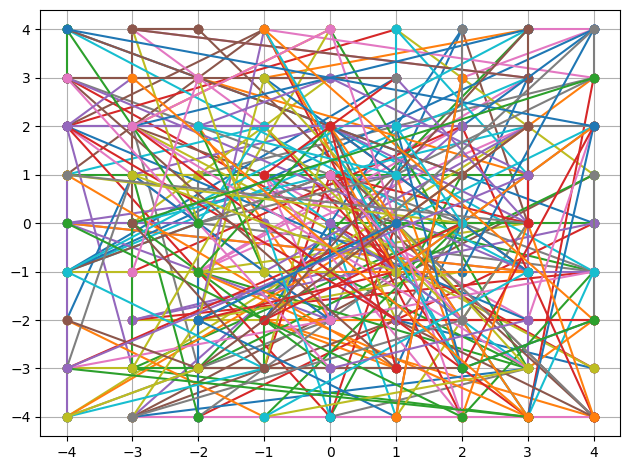

In [8]:
patchSize = 9
testNum = 256
p1Coords, p2Coords = generateBRIEFpattern(patchSize, testNum)

plt.figure()
for i in range(testNum):
    plt.plot([p1Coords[0, i], p2Coords[0, i]],
             [p1Coords[1, i], p2Coords[1, i]], marker='o')
plt.grid()
plt.tight_layout()

#### computePyrBRIEF
Napisati funkciju **computePyrBRIEF** koja za određene lokacije obeležja u prostoru
Gausove piramide izračunava BRIEF deskriptore. Argumenti funkcije su:
**Ulazi**:
**GaussianPyramid** – *Gausova iz koje se izračunava BRIEF opis obeležja*\
**featureLocations** – *lokacije obeležja u okviru Gausove piramide*\
**k** – *faktor povećanja standardne devijacije filtra za određivanje narednog nivoa piramide*\
**patchSize** – *dimenzije lokalnog susedstva na nivou 0*\
**p1Coords** – *lista koordinata tačaka koje se koriste kao prve u poređenju.*\
**p2Coords** – *lista koordinata tačaka koje se koriste kao druge u poređenju.*\

**Izlaz**:
**descBRIEF** – *matrica boolean vrednosti dimenzija KxN pri čemu je N broj deskriptora koji je
izračunat, a K predstavjla broj testova.*\
**locBRIEF** – *matrica 3xN koja sadrži informacije o poziciji deskriptora u prostoru i skali.*\

BRIEF deskriptor se na nivou 0 određuje na prozoru veličine patchSize. Za više nivoe
potrebno je srazmerno skalirati veličinu prozora za faktor $\sigma_l / \sigma_0$. Voditi računa da je
potrebno skalirati i pozicije test tačaka. Ukoliko se neko obeležje nalazi na ivicama slike
tako da nema kompletno lokalno susedstvo, za takvo obeleže se ne računa deskriptor.

#### Implementacija
Za svaku tacku detektovanu obelezje, generise se vektor koji ogovara poredjenjima po prosledjenom sablonu.  

In [9]:
def computePyrBRIEF(GaussianPyramid, featureLocations,
                    k, patchSize, p1Coords, p2Coords):
    """
    Ulazi:
        GaussianPyramid – Gausova iz koje se izračunava BRIEF opis obeležja
        featureLocations – lokacije obeležja u okviru Gausove piramide
        k – faktor povećanja standardne devijacije filtra za određivanje narednog nivoa piramide
        patchSize – dimenzije lokalnog susedstva na nivou 0
        p1Coords – lista koordinata tačaka koje se koriste kao prve u poređenju.
        p2Coords – lista koordinata tačaka koje se koriste kao druge u poređenju.
    
    Izlaz:
        descBRIEF – matrica boolean vrednosti dimenzija KxN pri čemu je N broj deskriptora koji je
        izračunat, a K predstavjla broj testova.
        locBRIEF – matrica 3xN koja sadrži informacije o poziciji deskriptora u prostoru i skali.
    """
    h, w = GaussianPyramid[0].shape
    K = p1Coords.shape[1]

    descBRIEF = []
    locBRIEF = []
    for i in range(featureLocations.shape[0]):
        x = featureLocations[i, 1]
        y = featureLocations[i, 0]
        l = featureLocations[i, 2]
        scale_fact = k**l
        new_patchSize = int(np.round(scale_fact*patchSize))
        if (x-new_patchSize//2 >= 0) and (x+new_patchSize//2 < w):
            if (y-new_patchSize//2 >= 0) and (y+new_patchSize//2 < h):
                temp = np.zeros(shape=(K,), dtype=bool)
                for j in range(K):
                    x_p1 = x + \
                        int(np.round(p1Coords[0, j] *
                            scale_fact))
                    y_p1 = y + \
                        int(np.round(p1Coords[1, j] *
                            scale_fact))

                    x_p2 = x + \
                        int(np.round(p2Coords[0, j] *
                            scale_fact))
                    y_p2 = y + \
                        int(np.round(p2Coords[1, j] *
                            scale_fact))

                    p1 = GaussianPyramid[l][y_p1, x_p1]
                    p2 = GaussianPyramid[l][y_p2, x_p2]
                    
                    temp[j] = p1 < p2
                    
                descBRIEF.append(temp)
                locBRIEF.append([y, x, l])
                

    return np.array(descBRIEF).T, np.array(locBRIEF).T

#### Rezultat

In [10]:
descBRIEF, locBRIEF = computePyrBRIEF(GaussianPyramid, featureLocations, k, patchSize, p1Coords, p2Coords)

## ZADATAK 3 – Realizacija funkcije za uparivanje obeležja
U okviru ovog zadatka potrebno je napisati funkciju za uparivanje obeležja matchBRIEF.
Funkcija prihvata 4 argumenta sa deskriptorima i lokacijama obeležja iz dve slike. Uparivanje se
obavlja određivanjem Hamingovog rastojanja između vrednosti deskriptora. Uparivanje se obavlja
tako što se za svako obeležje iz jednog skupa odrede dva najbliža obeležja iz drugog skupa. Par se
prihvata ukoliko je količnik rastojanja naboljeg i drugog najboljeg para manji od zadatog praga.
Potrebno je obezbediti mogućnost i unakrsnog testiranja parova (par se prihvata ukoliko
zadovoljava količnički test i kada slike zamene mesta). Argumenti funkcije su:

**Ulazi**:\
**descriptor1** – *opisi obeležja prve slike*\
**location1** – *lokacije obeležja prve slike*\
**descriptor2** – *opisi obeležja druge slike*\
**location2** – *lokacije obeležja druge slike*\
**ratioThr** – *prag količničkog testa*\
**crossCheck** – *False – ne koristi se unakrsno poređenje, True – koristi se unakrsno poređenje*\

**Izlaz**:
**matches** – *lista od N uparenih tačaka. Svako polje liste sadrži listu sa lokacijom obeležja u prvoj i
drugoj slici kao i distancu između obeležja.*

U izveštaju opisati realizaciju i prikazati rezultate uparivanja slike can_model.jpg sa ostalim
slikama iz imgs/can direktorijuma. Prilikom testiranja koristiti $\theta_r = 0.8$ - za prag količničkog
testa.

#### Implementacija 
Za opciju bez unakrsnog poredjenja, uparivanje se vrsi samo u jednom smeru, tako sto se odnos meri Hamming-ovo rastojanje u jednom smeru, i posmatra kolicnicki test. Za opciju sa unakrsnim testom, uparivanje se vrsi u oba smera i odbaciju se parovi koji postoje samo u jednom smeru.

In [11]:
def matchBRIEF(descriptor1, location1,
               descriptor2, location2,
               ratioThr, crossCheck=False):
    """
    Ulazi:
        descriptor1 – opisi obeležja prve slike
        location1 – lokacije obeležja prve slike
        descriptor2 – opisi obeležja druge slike
        location2 – lokacije obeležja druge slike
        ratioThr – prag količničkog testa
        crossCheck – False – ne koristi se unakrsno poređenje, True – koristi se unakrsno poređenje
    Izlaz:
        matches – lista od N uparenih tačaka. Svako polje liste sadrži listu sa lokacijom obeležja u prvoj i
        drugoj slici kao i distancu između obeležja.
    """
    matches = []
    matches12 = []
    N1 = descriptor1.shape[1]
    N2 = descriptor2.shape[1]
    
    for i in range(N1):
        hammingDist = 0
        min_dist = np.inf
        index_min_dist = 0
        next_min_dist = np.inf
        for j in range(N2):
            hammingDist = np.sum(np.logical_xor(descriptor1[:, i],
                                                descriptor2[:, j]))
            
            if min_dist > hammingDist:
                next_min_dist = min_dist
                
                min_dist = hammingDist
                index_min_dist = j
                
        test = min_dist/next_min_dist
        if test < ratioThr:
            matches12.append(np.array([location1[0, i],
                                       location1[1, i],
                                       location1[2, i],
                                       location2[0, index_min_dist],
                                       location2[1, index_min_dist],
                                       location2[2, index_min_dist],
                                       min_dist]))
            
    if crossCheck:
        temp = np.copy(descriptor1)
        descriptor1 = np.copy(descriptor2)
        descriptor2 = np.copy(temp)
        
        temp = np.copy(location1)
        location1 = np.copy(location2)
        location2 = np.copy(temp)
        
        matches21 = []
        N1 = descriptor1.shape[1]
        N2 = descriptor2.shape[1]
        
        for i in range(N1):
            hammingDist = 0
            min_dist = np.inf
            index_min_dist = 0
            next_min_dist = np.inf
            for j in range(N2):
                hammingDist = np.sum(np.logical_xor(descriptor1[:, i],
                                                    descriptor2[:, j]))
                
                if min_dist > hammingDist:
                    next_min_dist = min_dist
                    
                    min_dist = hammingDist
                    index_min_dist = j
                    
            test = min_dist/next_min_dist
            if test < ratioThr:
                matches21.append(np.array([location2[0, index_min_dist],
                                           location2[1, index_min_dist],
                                           location2[2, index_min_dist],
                                           location1[0, i],
                                           location1[1, i],
                                           location1[2, i],
                                           min_dist]))
        
        for i in range(len(matches12)):
            for j in range(len(matches21)):
                if (matches12[i] == matches21[j]).all():
                    matches.append(matches12[i])
                    
    else:
        matches = matches12
    return matches

#### Rezuatati - bez unakrsnog testa

/tmp/ipykernel_53732/4149997691.py:31: RuntimeWarning: divide by zero encountered in scalar divide
  R = np.trace(M)**2/np.linalg.det(M)


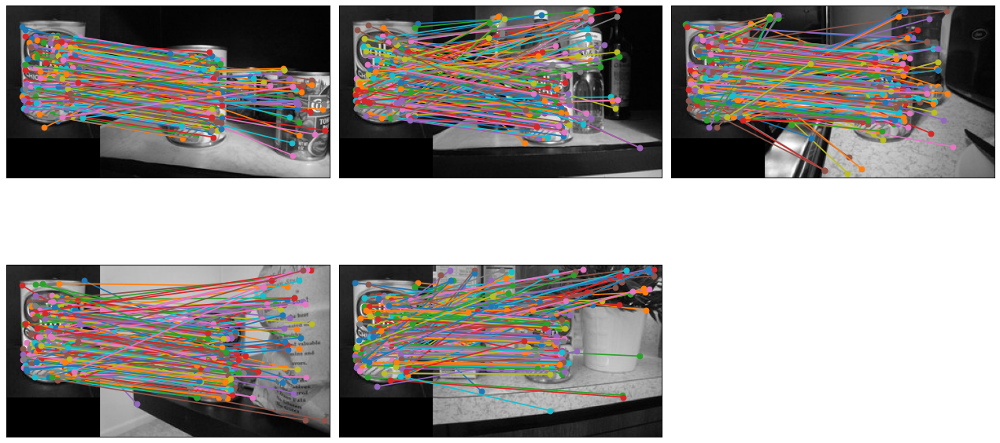

In [12]:
ratioThr = 0.8
crossCheck = False
fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI, nrows=2, ncols=3)
ax = ax.ravel()
ax[5].remove()
for i in range(1, 6):
    file_name = "can{}.jpg".format(i)
    file_path = os.path.join(dir_path, file_name)
    img_i = cv.imread(file_path, cv.IMREAD_GRAYSCALE)
    img_i = img_i/ 255.
    GaussianPyramid_i, DoGPyramid_i = createPyramid(img_i, sigma0, k, numLevels)
    featureLocations_i = detectDoGFeatures(DoGPyramid_i, uniformThr, edgeThr)
    descBRIEF_i, locBRIEF_i = computePyrBRIEF(GaussianPyramid_i, featureLocations_i, k, patchSize, p1Coords, p2Coords)
    matches = matchBRIEF(descriptor1=descBRIEF, location1=locBRIEF,
                         descriptor2=descBRIEF_i, location2=locBRIEF_i,
                         ratioThr=ratioThr, crossCheck=crossCheck)
    
    h, w = img.shape
    h_i, w_i = img_i.shape
    img_matches = np.zeros(shape=(np.max([h, h_i]), w+w_i))
    
    img_matches[0:h, 0:w] = img
    img_matches[0:h_i, w:w+w_i] = img_i
    ax[i-1].imshow(img_matches, cmap="gray")
    for j in range(len(matches)):
        ax[i-1].plot([matches[j][1], matches[j][4]+w], [matches[j][0], matches[j][3]], marker = 'o')
    ax[i-1].set_xticks([]), ax[i-1].set_yticks([]) 
plt.tight_layout()

#### Rezultati - sa unakrsnim testom

/tmp/ipykernel_53732/4149997691.py:31: RuntimeWarning: divide by zero encountered in scalar divide
  R = np.trace(M)**2/np.linalg.det(M)


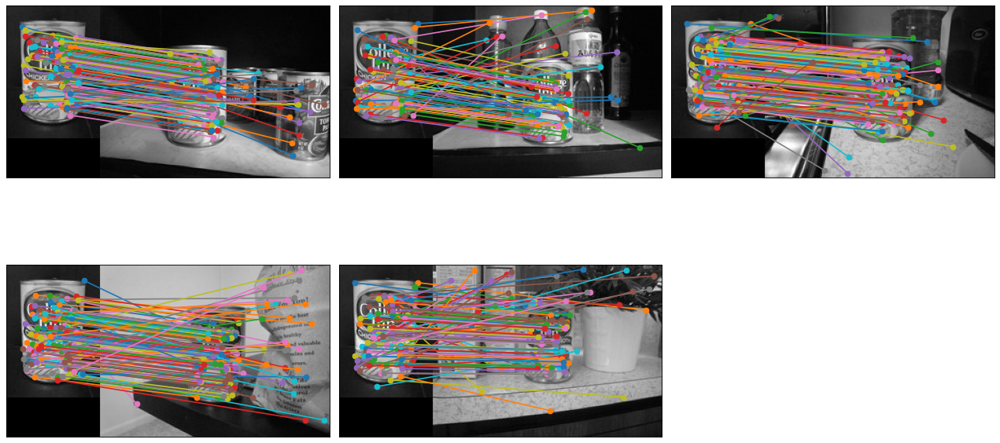

In [13]:
crossCheck = True
fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI, nrows=2, ncols=3)
ax = ax.ravel()
ax[5].remove()
for i in range(1, 6):
    file_name = "can{}.jpg".format(i)
    file_path = os.path.join(dir_path, file_name)
    img_i = cv.imread(file_path, cv.IMREAD_GRAYSCALE)
    img_i = img_i/ 255.
    GaussianPyramid_i, DoGPyramid_i = createPyramid(img_i, sigma0, k, numLevels)
    featureLocations_i = detectDoGFeatures(DoGPyramid_i, uniformThr, edgeThr)
    descBRIEF_i, locBRIEF_i = computePyrBRIEF(GaussianPyramid_i, featureLocations_i, k, patchSize, p1Coords, p2Coords)
    matches = matchBRIEF(descriptor1=descBRIEF, location1=locBRIEF,
                         descriptor2=descBRIEF_i, location2=locBRIEF_i,
                         ratioThr=ratioThr, crossCheck=crossCheck)
    
    h, w = img.shape
    h_i, w_i = img_i.shape
    img_matches = np.zeros(shape=(np.max([h, h_i]), w+w_i))
    
    img_matches[0:h, 0:w] = img
    img_matches[0:h_i, w:w+w_i] = img_i
    ax[i-1].imshow(img_matches, cmap="gray")
    for j in range(len(matches)):
        ax[i-1].plot([matches[j][1], matches[j][4]+w], [matches[j][0], matches[j][3]], marker = 'o')
    ax[i-1].set_xticks([]), ax[i-1].set_yticks([])
plt.tight_layout()

## ZADATAK 4 – Testiranje robusnosti BRIEF deskriptora

U okviru ovog zadatka potrebno je istestirati robusnost razvijenog BRIEF deskriptora.
Postupak testiranja:
1) Prilikom testiranja koristiti sliku can_template.jpg.
2) Detektovati karakteristična obeležja korsićenjem detectDoGFeatures funkcije.
3) Generisati geometrijsku transformaciju i primeniti je na sliku.
4) Detektovati karakteristična obeležja na transformisanoj slici korišćenjem
detectDoGFeatures funkcije
5) Generisati BRIEF deskriptore korišćenjem funkcije computePyrBRIEF na polaznoj i
transformisanoj slici.
6) Upariti deskriptore korišćenjem matchBRIEF funkcije.
7) Za svaki par odrediti da li je ispravno detektovan ili ne određivanjem prave lokacije
polazne karakteristične tačke u transformisanoj slici korišćenjem poznate transformacione
funkcije. Smatrati da je uparivanje ispravno ako pozicija detektovanog obeležja na
transformisanoj slici odstupa od prave vrednosti za najviše ±3 piksela.
8) Za svaki test slučaj odrediti ukupan broj detektovanih parova, ukupan broj ispravno
detektovanih parova i njihov odnos.

#### Implementacija -  gnerisanje rotiranih slika

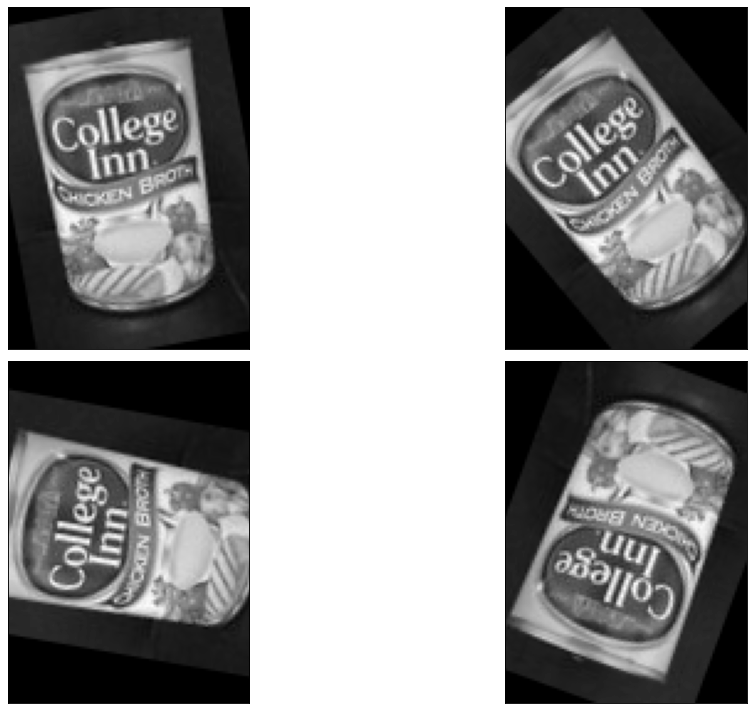

In [14]:
angles = [10, 40, 80, 160]
tx, ty = np.array((w // 2, h // 2))
scale = 1
fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI, nrows=2, ncols=2)
ax = ax.ravel()
img_rotation = []
M_rotation = []
for i in range(len(angles)):
    Ma = cv.getRotationMatrix2D((tx*1.0, ty*1.0), angles[i], scale)
    M_rotation.append(Ma)
    img_out = cv.warpAffine(img, Ma, (w, h), flags=cv.INTER_LINEAR, borderMode=cv.BORDER_CONSTANT, borderValue=0)
    ax[i].imshow(img_out, cmap="gray")
    ax[i].set_xticks([]), ax[i].set_yticks([])
    img_rotation.append(img_out)
    
plt.tight_layout()

#### Rezultati - Rotacija

/tmp/ipykernel_53732/4149997691.py:31: RuntimeWarning: invalid value encountered in scalar divide
  R = np.trace(M)**2/np.linalg.det(M)
/tmp/ipykernel_53732/4149997691.py:31: RuntimeWarning: divide by zero encountered in scalar divide
  R = np.trace(M)**2/np.linalg.det(M)


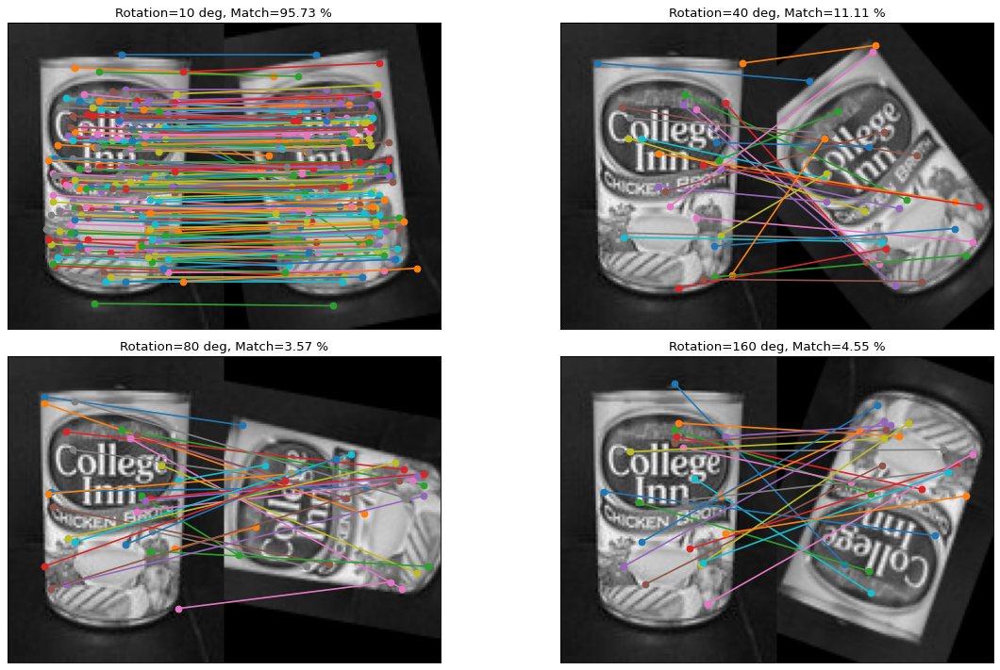

In [15]:
crossCheck = True
fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI, nrows=2, ncols=2)
ax = ax.ravel()
for i in range(len(angles)):
    img_i = img_rotation[i]
    GaussianPyramid_i, DoGPyramid_i = createPyramid(img_i, sigma0, k, numLevels)
    featureLocations_i = detectDoGFeatures(DoGPyramid_i, uniformThr, edgeThr)
    descBRIEF_i, locBRIEF_i = computePyrBRIEF(GaussianPyramid_i, featureLocations_i, k, patchSize, p1Coords, p2Coords)
    matches = matchBRIEF(descriptor1=descBRIEF, location1=locBRIEF,
                         descriptor2=descBRIEF_i, location2=locBRIEF_i,
                         ratioThr=ratioThr, crossCheck=crossCheck)
    
    h, w = img.shape
    h_i, w_i = img_i.shape
    img_matches = np.zeros(shape=(np.max([h, h_i]), w+w_i))
    
    img_matches[0:h, 0:w] = img
    img_matches[0:h_i, w:w+w_i] = img_i
    ax[i].imshow(img_matches, cmap="gray")
    good_match_cnt = 0
    for j in range(len(matches)):
        coord_transformed = M_rotation[i]@np.array([matches[j][1], matches[j][0], 1]).T
        coord_matched = np.array([matches[j][4], matches[j][3]])
        if np.sqrt(np.sum(coord_transformed-coord_matched)**2) < 3:
            good_match_cnt += 1
        ax[i].plot([matches[j][1], matches[j][4]+w], [matches[j][0], matches[j][3]], marker = 'o')
    ax[i].set_xticks([]), ax[i].set_yticks([])
    ax[i].set_title("Rotation={} deg, Match={:.2f} %".format(angles[i], good_match_cnt/len(matches)*100))
plt.tight_layout()

#### Implementacija - generisanje skaliranig slika

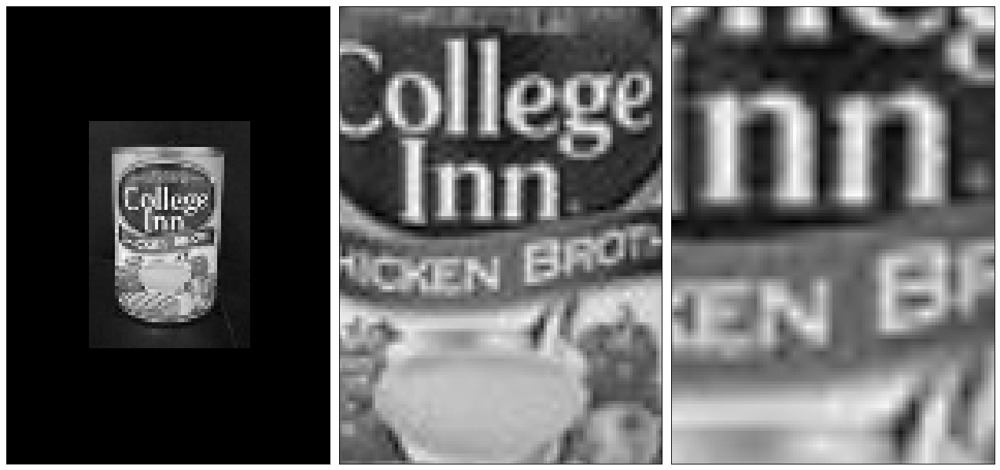

In [16]:
angle = 0
tx, ty = np.array((w // 2, h // 2))
scales = [0.5, 2, 4]
fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI, nrows=1, ncols=3)
ax = ax.ravel()
img_scales = []
M_scales = []
for i in range(len(scales)):
    Ma = cv.getRotationMatrix2D((tx*1.0, ty*1.0), angle, scales[i])
    M_scales.append(Ma)
    img_out = cv.warpAffine(img, Ma, (w, h), flags=cv.INTER_LINEAR, borderMode=cv.BORDER_CONSTANT, borderValue=0)
    ax[i].imshow(img_out, cmap="gray")
    ax[i].set_xticks([]), ax[i].set_yticks([])
    img_scales.append(img_out)
    
plt.tight_layout()

#### Rezultati - Skaliranje

/tmp/ipykernel_53732/4149997691.py:31: RuntimeWarning: invalid value encountered in scalar divide
  R = np.trace(M)**2/np.linalg.det(M)
/tmp/ipykernel_53732/4149997691.py:31: RuntimeWarning: divide by zero encountered in scalar divide
  R = np.trace(M)**2/np.linalg.det(M)


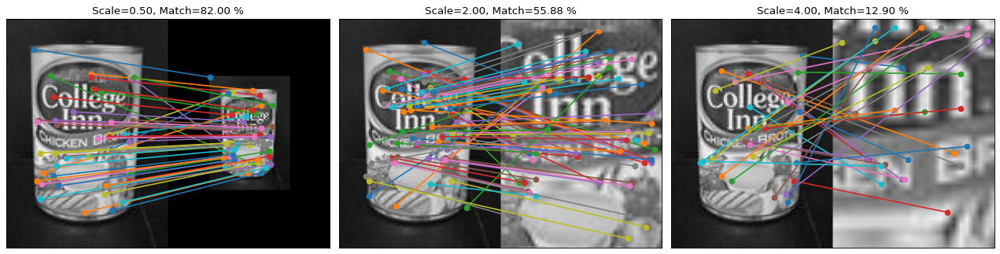

In [17]:
crossCheck = True
fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI, nrows=1, ncols=3)
ax = ax.ravel()
for i in range(len(scales)):
    img_i = img_scales[i]
    GaussianPyramid_i, DoGPyramid_i = createPyramid(img_i, sigma0, k, numLevels)
    featureLocations_i = detectDoGFeatures(DoGPyramid_i, uniformThr, edgeThr)
    descBRIEF_i, locBRIEF_i = computePyrBRIEF(GaussianPyramid_i, featureLocations_i, k, patchSize, p1Coords, p2Coords)
    matches = matchBRIEF(descriptor1=descBRIEF, location1=locBRIEF,
                         descriptor2=descBRIEF_i, location2=locBRIEF_i,
                         ratioThr=ratioThr, crossCheck=crossCheck)
    
    h, w = img.shape
    h_i, w_i = img_i.shape
    img_matches = np.zeros(shape=(np.max([h, h_i]), w+w_i))
    
    img_matches[0:h, 0:w] = img
    img_matches[0:h_i, w:w+w_i] = img_i
    ax[i].imshow(img_matches, cmap="gray")
    good_match_cnt = 0
    for j in range(len(matches)):
        coord_transformed = M_scales[i]@np.array([matches[j][1], matches[j][0], 1]).T
        coord_matched = np.array([matches[j][4], matches[j][3]])
        if np.sqrt(np.sum(coord_transformed-coord_matched)**2) < 3:
            good_match_cnt += 1
        ax[i].plot([matches[j][1], matches[j][4]+w], [matches[j][0], matches[j][3]], marker = 'o')
    ax[i].set_xticks([]), ax[i].set_yticks([])
    ax[i].set_title("Scale={:.2f}, Match={:.2f} %".format(scales[i], good_match_cnt/len(matches)*100))
plt.tight_layout()

#### Implementacija - Afina transformacija

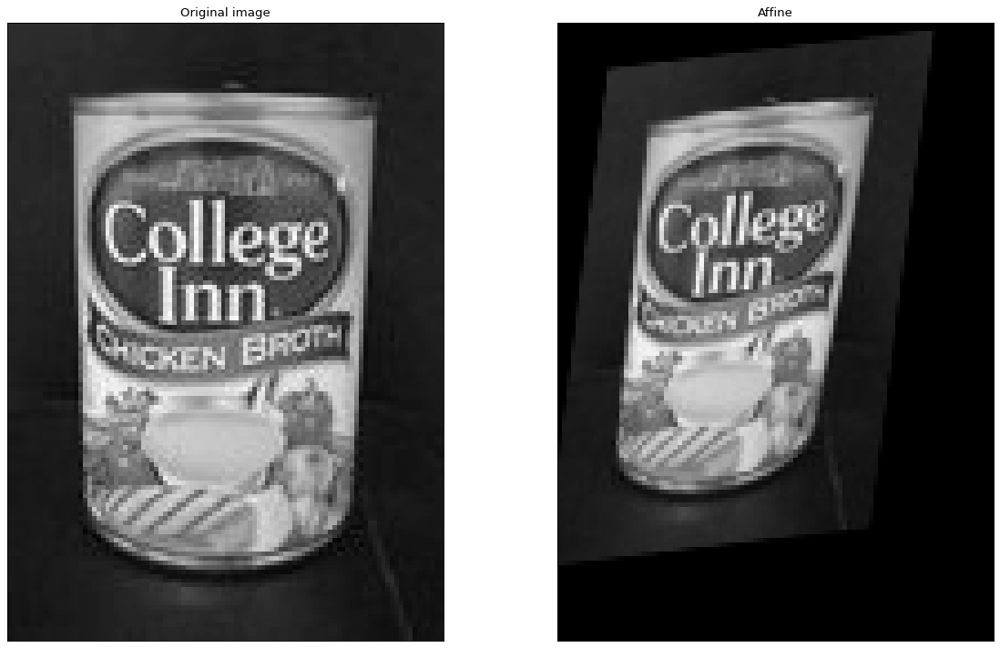

In [18]:
pts1 = np.float32([[14, 16], [81, 16],
                   [14, 113]])
pts2 = np.float32([[20, 22], [70, 16],
                   [10, 100]])
M_affine = cv.getAffineTransform(pts1, pts2)
img_affine = cv.warpAffine(img, M_affine, (w, h), flags=cv.INTER_LINEAR, borderMode=cv.BORDER_CONSTANT, borderValue=0)
fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI, nrows=1, ncols=2)
ax = ax.ravel()
ax[0].imshow(img, cmap="gray")
ax[0].set_xticks([]), ax[0].set_yticks([])
ax[0].set_title("Original image")
ax[1].imshow(img_affine, cmap="gray")
ax[1].set_xticks([]), ax[1].set_yticks([])
ax[1].set_title("Affine")
plt.tight_layout()

#### Rezultati - Afina transformacija

/tmp/ipykernel_53732/4149997691.py:31: RuntimeWarning: invalid value encountered in scalar divide
  R = np.trace(M)**2/np.linalg.det(M)
/tmp/ipykernel_53732/4149997691.py:31: RuntimeWarning: divide by zero encountered in scalar divide
  R = np.trace(M)**2/np.linalg.det(M)


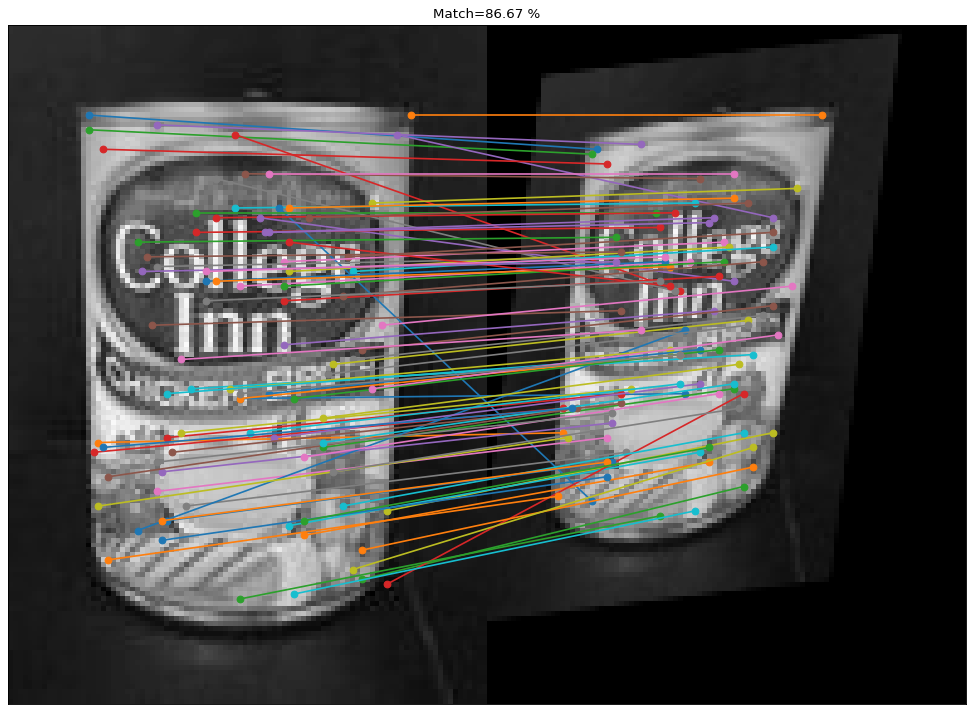

In [19]:
crossCheck = True
fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI, nrows=1, ncols=1)
img_i = img_affine
GaussianPyramid_i, DoGPyramid_i = createPyramid(img_i, sigma0, k, numLevels)
featureLocations_i = detectDoGFeatures(DoGPyramid_i, uniformThr, edgeThr)
descBRIEF_i, locBRIEF_i = computePyrBRIEF(GaussianPyramid_i, featureLocations_i, k, patchSize, p1Coords, p2Coords)
matches = matchBRIEF(descriptor1=descBRIEF, location1=locBRIEF,
                     descriptor2=descBRIEF_i, location2=locBRIEF_i,
                     ratioThr=ratioThr, crossCheck=crossCheck)

h, w = img.shape
h_i, w_i = img_i.shape
img_matches = np.zeros(shape=(np.max([h, h_i]), w+w_i))

img_matches[0:h, 0:w] = img
img_matches[0:h_i, w:w+w_i] = img_i
ax.imshow(img_matches, cmap="gray")
good_match_cnt = 0
for j in range(len(matches)):
    coord_transformed = M_affine@np.array([matches[j][1], matches[j][0], 1]).T
    coord_matched = np.array([matches[j][4], matches[j][3]])
    if np.sqrt(np.sum(coord_transformed-coord_matched)**2) < 3:
        good_match_cnt += 1
    ax.plot([matches[j][1], matches[j][4]+w], [matches[j][0], matches[j][3]], marker = 'o')
ax.set_xticks([]), ax.set_yticks([])
ax.set_title("Match={:.2f} %".format(good_match_cnt/len(matches)*100))
plt.tight_layout()

#### Implementacija - Perspektiva slike

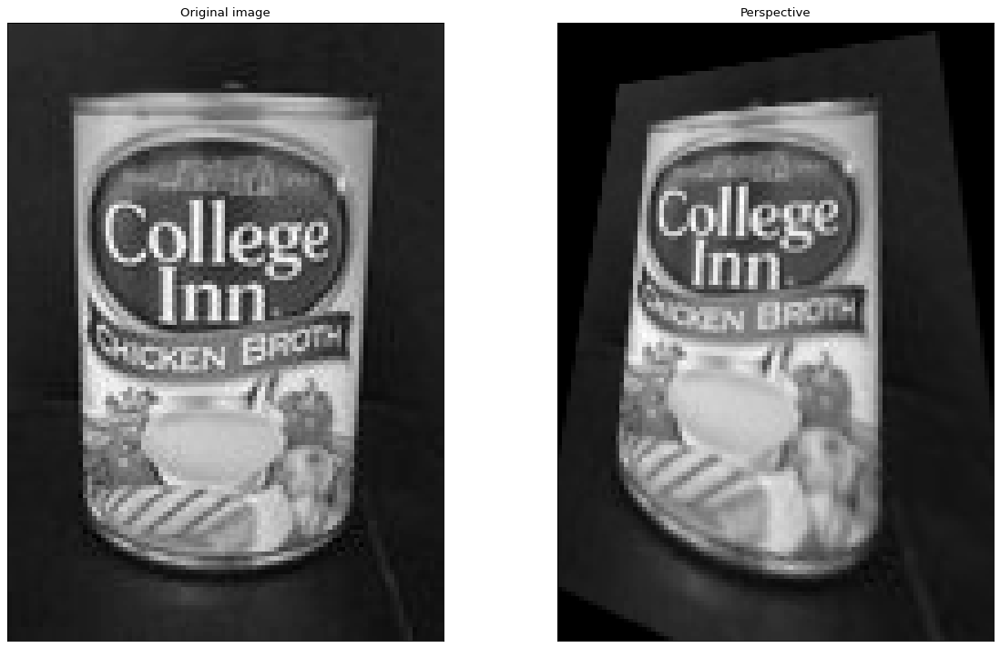

In [20]:
pts1 = np.float32([[14, 16], [81, 16],
                   [14, 113], [81, 113]])
pts2 = np.float32([[20, 22], [70, 16],
                   [10, 100], [78, 120]])
M_perspective = cv.getPerspectiveTransform(pts1, pts2)
img_perspective = cv.warpPerspective(img, M_perspective, (w, h), flags=cv.INTER_LINEAR, borderMode=cv.BORDER_CONSTANT, borderValue=0)
fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI, nrows=1, ncols=2)
ax = ax.ravel()
ax[0].imshow(img, cmap="gray")
ax[0].set_xticks([]), ax[0].set_yticks([])
ax[0].set_title("Original image")
ax[1].imshow(img_perspective, cmap="gray")
ax[1].set_xticks([]), ax[1].set_yticks([])
ax[1].set_title("Perspective")
plt.tight_layout()

#### Rezultati - Perspektiva slike

/tmp/ipykernel_53732/4149997691.py:31: RuntimeWarning: invalid value encountered in scalar divide
  R = np.trace(M)**2/np.linalg.det(M)
/tmp/ipykernel_53732/4149997691.py:31: RuntimeWarning: divide by zero encountered in scalar divide
  R = np.trace(M)**2/np.linalg.det(M)


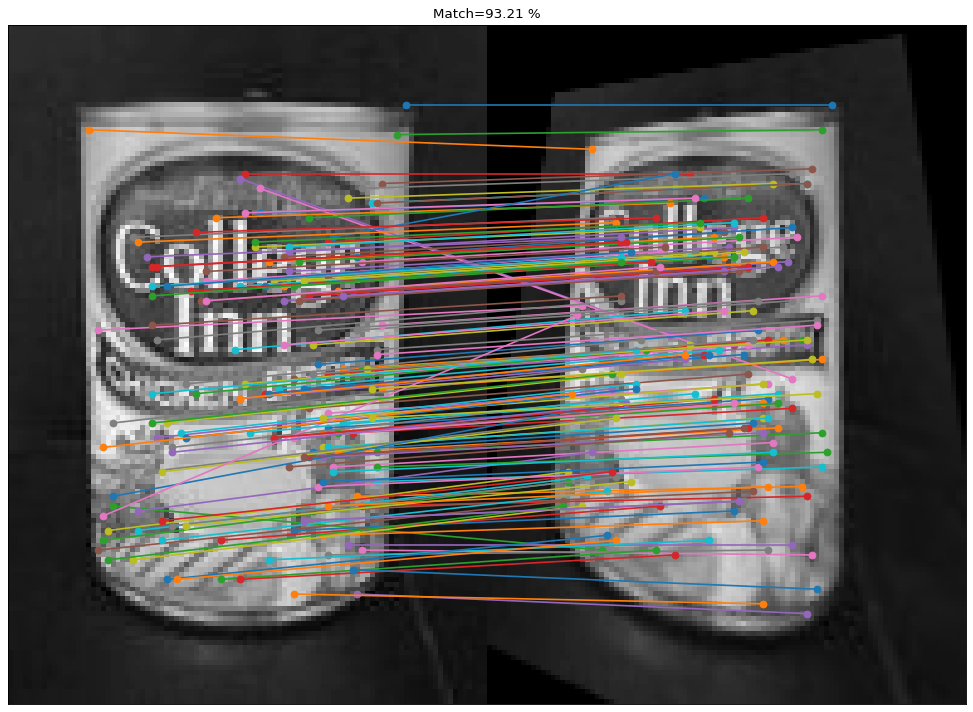

In [21]:
crossCheck = True
fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI, nrows=1, ncols=1)
img_i = img_perspective
GaussianPyramid_i, DoGPyramid_i = createPyramid(img_i, sigma0, k, numLevels)
featureLocations_i = detectDoGFeatures(DoGPyramid_i, uniformThr, edgeThr)
descBRIEF_i, locBRIEF_i = computePyrBRIEF(GaussianPyramid_i, featureLocations_i, k, patchSize, p1Coords, p2Coords)
matches = matchBRIEF(descriptor1=descBRIEF, location1=locBRIEF,
                     descriptor2=descBRIEF_i, location2=locBRIEF_i,
                     ratioThr=ratioThr, crossCheck=crossCheck)

h, w = img.shape
h_i, w_i = img_i.shape
img_matches = np.zeros(shape=(np.max([h, h_i]), w+w_i))

img_matches[0:h, 0:w] = img
img_matches[0:h_i, w:w+w_i] = img_i
ax.imshow(img_matches, cmap="gray")
good_match_cnt = 0
for j in range(len(matches)):
    coord_transformed = M_perspective@np.array([matches[j][1], matches[j][0], 1]).T
    coord_matched = np.array([matches[j][4], matches[j][3]])
    if np.sqrt(np.sum(coord_transformed[0:2]/coord_transformed[2]-coord_matched)**2) < 3:
        good_match_cnt += 1
    ax.plot([matches[j][1], matches[j][4]+w], [matches[j][0], matches[j][3]], marker = 'o')
ax.set_xticks([]), ax.set_yticks([])
ax.set_title("Match={:.2f} %".format(good_match_cnt/len(matches)*100))
plt.tight_layout()

#### Komentar: 
Implementirani detektor, radi zadovoljavajuce u svim slucajevima osim u slucajevima, velikog skaliranja i rotacije za "velike" uglove.
Razlog loseg rada za slucaj rotacije za "veliki" je taj sto sablon po kom se generisu deskriptori nije zarotiran, te ce Hamming-ova rastojanja biti velika za znacajne rotacije. Sto se tice skaliranja, problem moze biti resen uvodjenjem veceg broj nivoa, odnsno skala u piramidi.

## ZADATAK 5 – Panorama
U okviru ovog zadatka je potrebno korišćenjem prethodno razvijenih alata za pronalaženje parova
tačaka odrediti nepoznatu transformaciju između slika i nakon toga ih spojiti u jednistvenu
panoramu. 

### Testiranje BRIEF deskriptora
U direktorijumu imgs/pano nalaze se dve slike panorame grada. Potrebno je spojiti ove
dve slike u jedinstvenu panoramu.
Najpre pokušati estimaciju korišćenjem razvijenog BRIEF deskriptora. Ukoliko je ovaj
postupak neuspešan iskoristiti SIFT deskriptor iz OpenCV-a. U izveštaju je potrebno
prokomentarisati dobijene rezultate.
U izveštaju detaljno opisati primenjeni postupak (sa međurezultatima uparivanja) i
prikazati postignute rezultate. Prokomentarisati uspešnost BRIEF deskriptora.

#### Ucitavanje slika

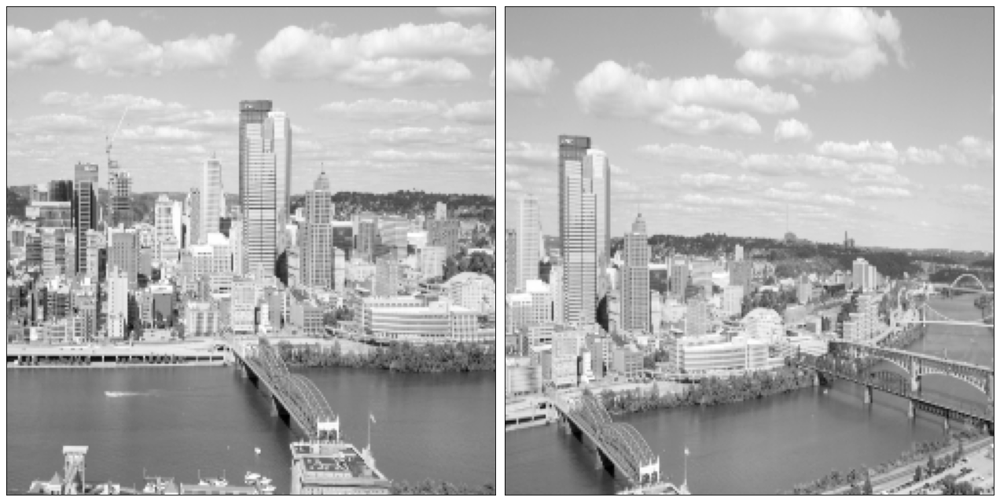

In [22]:
dir_path = "./imgs/pano"
file_name = "pano{}.png".format(1)
file_path = os.path.join(dir_path, file_name)
img1 = cv.imread(file_path, cv.IMREAD_GRAYSCALE)
img1 = img1 / 255.
img1 = cv.resize(img1, (250, 250), interpolation = cv.INTER_LINEAR)

file_name = "pano{}.png".format(2)
file_path = os.path.join(dir_path, file_name)
img2 = cv.imread(file_path, cv.IMREAD_GRAYSCALE)
img2 = img2 / 255.
img2 = cv.resize(img2, (250, 250), interpolation = cv.INTER_LINEAR)

fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI, nrows=1, ncols=2)
ax[0].imshow(img1, cmap="gray")
ax[0].set_xticks([]), ax[0].set_yticks([])
ax[1].imshow(img2, cmap="gray")
ax[1].set_xticks([]), ax[1].set_yticks([])
plt.tight_layout()

#### Implementacija - Uparivanje
Formiraju se piramide, obelezja i deskriptori, nakon cega se vrsi uparivanje.

In [23]:
crossCheck = True

GaussianPyramid1, DoGPyramid1 = createPyramid(img1, sigma0, k, numLevels)
GaussianPyramid2, DoGPyramid2 = createPyramid(img2, sigma0, k, numLevels)

featureLocations1 = detectDoGFeatures(DoGPyramid1, uniformThr, edgeThr)
featureLocations2 = detectDoGFeatures(DoGPyramid2, uniformThr, edgeThr)

descBRIEF1, locBRIEF1 = computePyrBRIEF(GaussianPyramid1, featureLocations1, k, patchSize, p1Coords, p2Coords)
descBRIEF2, locBRIEF2 = computePyrBRIEF(GaussianPyramid2, featureLocations2, k, patchSize, p1Coords, p2Coords)
matches = matchBRIEF(descriptor1=descBRIEF1, location1=locBRIEF1,
                     descriptor2=descBRIEF2, location2=locBRIEF2,
                     ratioThr=ratioThr, crossCheck=crossCheck)

#### Rezultat - Uparivanje

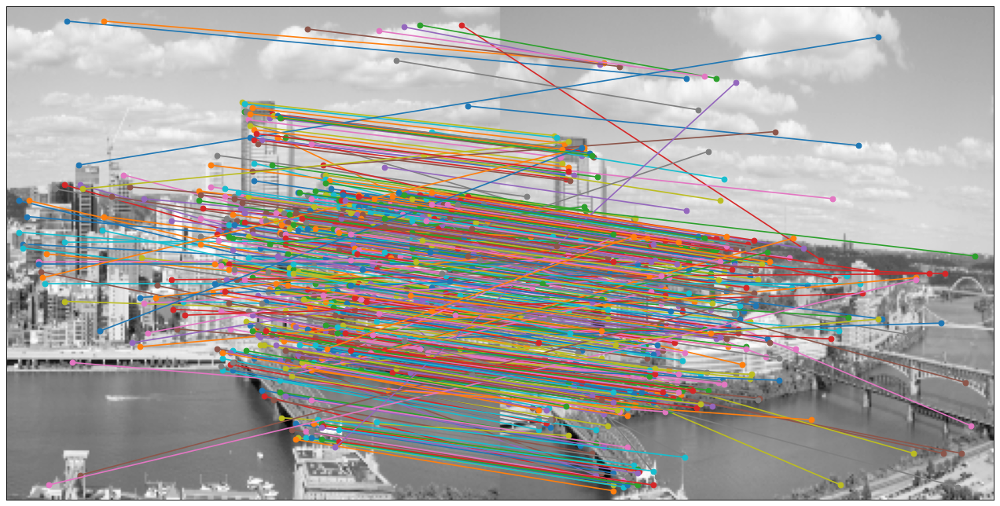

In [24]:
h1, w1 = img1.shape
h2, w2 = img2.shape
img_matches = np.zeros(shape=(np.max(np.array([h1, h2])), w1+w2))

fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI, nrows=1, ncols=1)
img_matches[0:h1, 0:w1] = img1
img_matches[0:h2, w1:w1+w2] = img2
ax.imshow(img_matches, cmap="gray")

for j in range(len(matches)):
    ax.plot([matches[j][1], matches[j][4]+w1], [matches[j][0], matches[j][3]], marker = 'o')
ax.set_xticks([]), ax.set_yticks([])
plt.tight_layout()

#### Implementacija - Odredjivanje homografije

In [25]:
src_points = []
dst_points = []
for j in range(len(matches)):
    src_points.append([matches[j][1], matches[j][0]])
    dst_points.append([matches[j][4], matches[j][3]])
H, _ = cv.findHomography(np.array(src_points, dtype=float), np.array(dst_points, dtype=float), cv.RANSAC)

#### Fukcije preuzete sa vezbi sluce iscrtavanju panorame

In [26]:
def to_homogeneous_coords(het_coords):
  hom_coords = np.ones((het_coords.shape[0], 3))
  for i in range(0, hom_coords.shape[0]):
    hom_coords[i][:2] = het_coords[i][:]
  return hom_coords

In [27]:
def to_heterogeneous_coords(hom_coords):
  return np.divide(hom_coords[:,:2], hom_coords[:,[-1]])

In [28]:
def warpImages(img1, img2, H, plot_outline=False):
  
  h1, w1 = img1.shape[:2]
  h2, w2 = img2.shape[:2]

  outline1 = np.float32([[0,0], [w1, 0], [w1, h1], [0, h1]])
  outline2 = np.float32([[0,0], [w2, 0], [w2, h2], [0, h2]])

  outline1_h = to_homogeneous_coords(outline1)
  outline2_h = to_homogeneous_coords(outline2)

  # When we have established a homography we need to warp perspective
  # Change field of view
  outline1_warped_h = np.transpose(H @ np.transpose(outline1_h))

  outline1_warped = to_heterogeneous_coords(outline1_warped_h)

  outline_stack = np.concatenate((outline1_warped, outline2), axis=0)

  [x_min, y_min] = outline_stack.min(axis=0)
  [x_max, y_max] = outline_stack.max(axis=0)

  h_out = np.int32(y_max - y_min)
  w_out = np.int32(x_max - x_min)
  
  T = np.array([[1, 0, -x_min], [0, 1, -y_min], [0, 0, 1]])

  mask1 = np.ones_like(img1)
  mask2 = np.ones_like(img2)

  img1_warped = cv.warpPerspective(img1,T@H, (w_out, h_out))
  mask1 = cv.warpPerspective(mask1,T@H, (w_out, h_out))

  img2_warped = cv.warpPerspective(img2,  T, (w_out, h_out))
  mask2 = cv.warpPerspective(mask2,  T, (w_out, h_out))

  output_img = np.zeros((h_out, w_out))

  output_img[mask1>0] = img1_warped[mask1>0]
  output_img[mask2>0] = img2_warped[mask2>0]

  if (plot_outline):
    output_img = cv.polylines(output_img,[np.int32(outline1_warped - [x_min, y_min])], True, (255,0,0), 3)
    output_img = cv.polylines(output_img,[np.int32(outline2 - [x_min, y_min])], True, (0,0,255), 3)

  return output_img

#### Rezultati - prikaz

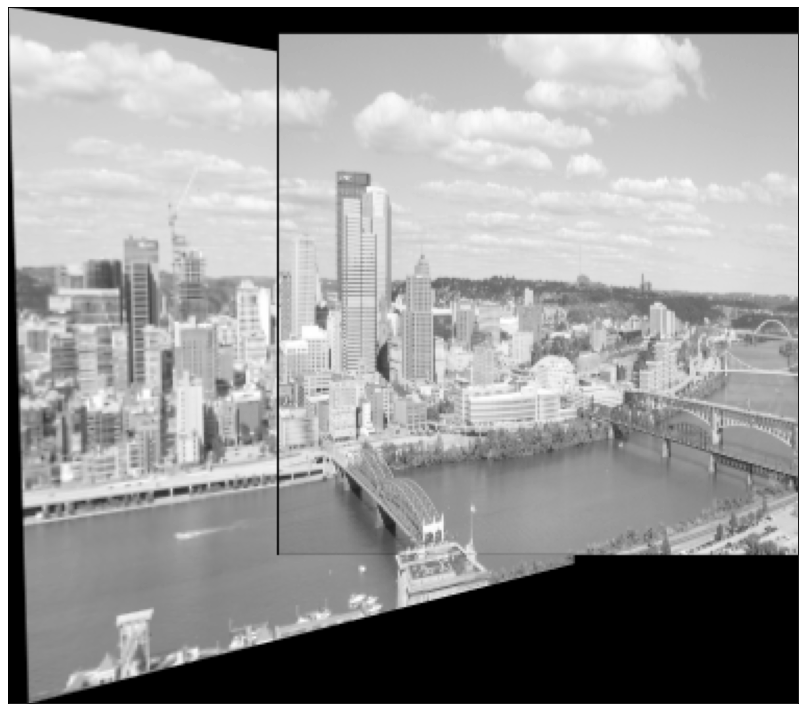

In [29]:
output_img = warpImages(img1, img2, H, plot_outline=False)
fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI)
ax.imshow(output_img, cmap="gray")
ax.set_xticks([]), ax.set_yticks([])
plt.tight_layout()

#### Komentar:
Implementirani detektor/deskriptor je na zadovaljavajuc nacin upario tacke. Napomena ulazne slike su decimirana zbog brzine izvrsavanja. 

### panoStich
Napisati funkciju panoStich koja prihvata listu od N slika i spaja ih u jednistvenu
panoramu. Smatrati da slike u listi redom predstavljaju scenu s leva na desno. Sve slike
transformisati u odnosu na središnju sliku u listi. Primer spajanja 4 slike prikazan je na slici
6. Generisati skup slika pomoću mobilnog telefona ili foto-aparata i demonstrirati rad
funkcije na ovom skupu slika.

#### Implementacija
Na osnovu BRIEF detektora/deskriptora vrsi se uparivanje i formira se matrica uzastopnih homografija slika (H_list), na osnovu ove matrice se formira matrica H u kojoj se nalaze matrice homografije u odnosu na centriranu sliku, nakon cega se vrsi formranje izlazne slike. Deo koda kojim se formira izlazna slika preuzet je sa casova vezbi, i prilagodjen.
Ulazne slike se decimiraju zbog vremena izvrsavanja koda.

In [30]:
def panoStich(imgs):
    """
    Ulaz:
        imgs - slike koje treba spojiti u panoramu

    Izlaz:
        output_img - panorama
    """
    N = len(imgs)
    imgs_resized = []
    imgs_resized_gray = []
    for i in range(N):
        img = np.copy(imgs[i])
        img = cv.resize(img, (200, 200), interpolation = cv.INTER_LINEAR)
        imgs_resized.append(cv.cvtColor(img, cv.COLOR_BGR2RGB))
        
        img_gray = cv.cvtColor(np.copy(imgs[i]), cv.COLOR_BGR2GRAY)
        temp = cv.resize(img_gray, (200, 200), interpolation = cv.INTER_LINEAR)
        temp = temp / 255.
        imgs_resized_gray.append(temp)
    
    H_list = []
    for i in range(0, N-1):
        img1 = imgs_resized_gray[i]
        img2 = imgs_resized_gray[i+1]
        crossCheck = True
        ratioThr = 0.5
    
        GaussianPyramid1, DoGPyramid1 = createPyramid(img1, sigma0, k, numLevels)
        GaussianPyramid2, DoGPyramid2 = createPyramid(img2, sigma0, k, numLevels)
        
        featureLocations1 = detectDoGFeatures(DoGPyramid1, uniformThr, edgeThr)
        featureLocations2 = detectDoGFeatures(DoGPyramid2, uniformThr, edgeThr)
        
        descBRIEF1, locBRIEF1 = computePyrBRIEF(GaussianPyramid1, featureLocations1, k, patchSize, p1Coords, p2Coords)
        descBRIEF2, locBRIEF2 = computePyrBRIEF(GaussianPyramid2, featureLocations2, k, patchSize, p1Coords, p2Coords)
        matches = matchBRIEF(descriptor1=descBRIEF1, location1=locBRIEF1,
                             descriptor2=descBRIEF2, location2=locBRIEF2,
                             ratioThr=ratioThr, crossCheck=crossCheck)
        
        src_points = []
        dst_points = []
        for j in range(len(matches)):
            src_points.append([matches[j][1], matches[j][0]])
            dst_points.append([matches[j][4], matches[j][3]])
        H, _ = cv.findHomography(np.array(src_points, dtype=float), np.array(dst_points, dtype=float), cv.RANSAC)
        H_list.append(H)

    index_cent = N//2

    index_cent = N//2
    H = []
    for i in range(index_cent):
        temp = np.identity(3)
        for j in range(index_cent-1, -1+i, -1):
            temp = temp@H_list[j]
        H.append(temp)
    
    H.append(np.identity(3))
    
    temp = np.identity(3)
    for i in range(index_cent, N-1):
        temp = temp@H_list[i]
        H.append(np.linalg.inv(temp))
        
    
    outline_in = []
    outline_in_h = []
    
    for i in range(0,N):
    	h, w = imgs_resized[i].shape[:2]
    	outline_in.append(np.array([[0, 0], [w-1, 0], [w-1, h-1], [0, h-1]], dtype=np.float32))
    	outline_in_h.append(np.array([[0, 0, 1], [w-1, 0, 1], [w-1, h-1, 1], [0, h-1, 1]], dtype=np.float32))
    
    outline_out = np.zeros_like(outline_in)
    outline_out_h = np.zeros_like(outline_in_h)
    
    
    for i in range(0,N):
    	outline_out_h[i] = np.transpose(H[i] @ np.transpose(outline_in_h[i]))
    	outline_out[i] = np.divide(outline_out_h[i][:,:2], outline_out_h[i][:,[-1]])
    
    out_x_min, out_y_min = (outline_out.min(axis=0)).min(axis=0)
    out_x_max, out_y_max = (outline_out.max(axis=0)).max(axis=0)
    
    width_out = np.int32(out_x_max - out_x_min)
    height_out = np.int32(out_y_max - out_y_min)
    
    T = np.array([[1, 0, -out_x_min],
                  [0, 1, -out_y_min],
    			  [0, 0,          1]], dtype=np.float32)
    
    for i in range(0,N):
    	outline_out[i][:] = outline_out[i][:] - [out_x_min, out_y_min]
    
    outline_out_img = np.zeros((height_out, width_out, 3))
    output_img = np.zeros((height_out, width_out, 3))
    
    for i in range(0,N):
    	outline_out_img = cv.polylines(outline_out_img,[np.int32(outline_out[i])], True, 255, 3)
    	mask = np.ones_like(imgs_resized[i])
    	mask = cv.warpPerspective(mask, T@H[i], (width_out, height_out))
    	temp = cv.warpPerspective(imgs_resized[i], T@H[i], (width_out, height_out))
    	output_img[mask>0] = temp[mask>0]
    

    
    return output_img.astype('uint8')

#### Ucitavanje slika

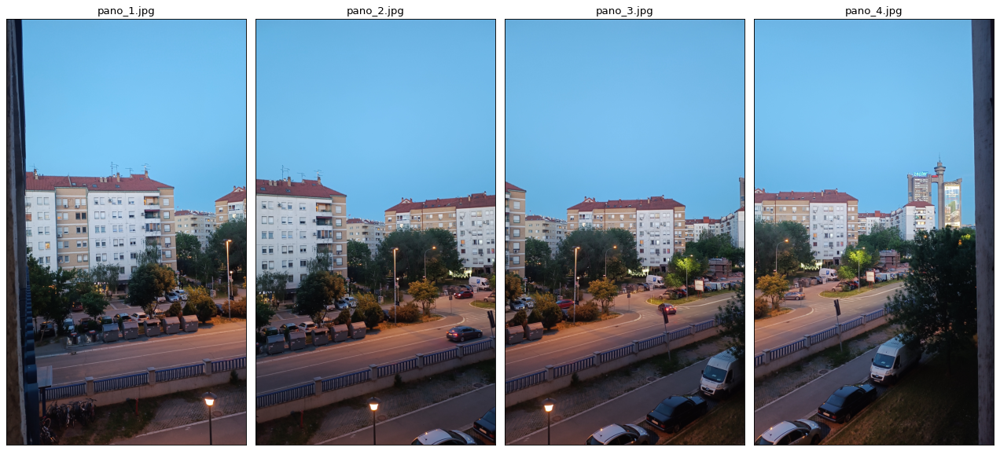

In [31]:
imgs = []
dir_path = "./imgs/pano_my"

fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI, ncols=4)
for i in range(4):
    file_name = "pano_{}.jpg".format(i+1)
    file_path = os.path.join(dir_path, file_name)
    img = cv.imread(file_path)
    imgs.append(img)
    ax[i].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    ax[i].set_xticks([]), ax[i].set_yticks([])
    ax[i].set_title(file_name)
plt.tight_layout()

#### Rezulati

In [32]:
pano = panoStich(imgs)

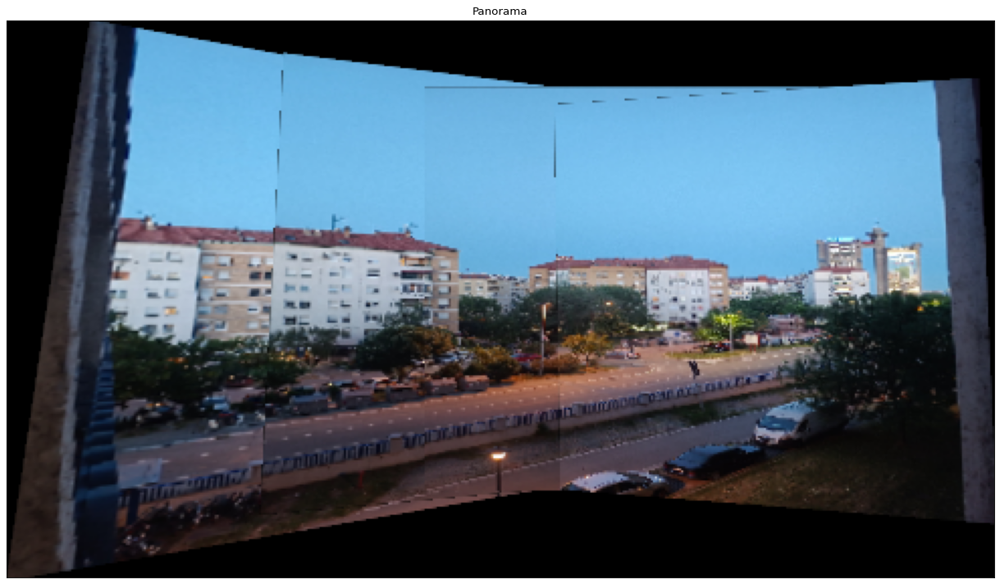

In [33]:
fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI)
ax.imshow(pano)
ax.set_xticks([]), ax.set_yticks([])
ax.set_title("Panorama")
plt.tight_layout()